In [1]:
import glob
import multiprocessing as mp
import matplotlib.pyplot as plt
import numpy as np
import os
import oscdeeppy as odp
from importlib import reload

# Image Lists

In [2]:
DTYPE = np.float32 # Not sure what int types will do; float64 is probably overkill 
BLACKPOINT_SIGMA = 2.7 # Larger tends to make darker images
SYMMETRY_SIGMA = 0.5 # offset from background peak in units of background sigma for stretching

ImageSet = odp.FITSSet

darks = glob.glob('../astro/2025_Cassiopeias_Ghost/2025-10-03_Cassiopeias_Ghost/Dark/*.fits')
flats = glob.glob('../astro/2025_Cassiopeias_Ghost/2025-10-03_Cassiopeias_Ghost/Flat/*.fits')
lights = glob.glob('../astro/2025_Cassiopeias_Ghost/2025-10-03_Cassiopeias_Ghost/Light/*.fits')
tag = 'ic63_cassiopeias_ghost'

print(len(flats),len(darks),len(lights))

50 50 149


# Calibration Data Processing

In order to image very dim objects, one requires a very sensitive and very well calibrated sensor. Data taken in contrived situations (very short exposure, lens cap on or off, pointed at uniform white surface, etc) provide footholds for calculating unknown quantities in the imaging system, like precise per-pixel sensitivity, positions of dust shadows, hot/dead pixels etc.

## Dark

Dark frames are nominally long exposure at the same gain as light frames, but with the sensor dark. These capture noise that builds with time. Helpful to have the same exposure time as light frames, but can be scaled to compensate. The ASI2600 is close enough to zero dark noise that I take darks for my flats and reuse them for the lights (same gain and offset) and ignore bias calibration (dark and bias are the same, effectively).

In [3]:
dark_set = ImageSet(darks)

In [4]:
dark_set[0]

array([[518, 505, 517, ..., 509, 533, 504],
       [509, 962, 502, ..., 975, 497, 949],
       [518, 505, 541, ..., 498, 525, 495],
       ...,
       [503, 949, 506, ..., 970, 503, 943],
       [523, 496, 524, ..., 505, 519, 499],
       [502, 945, 508, ..., 973, 503, 943]],
      shape=(4176, 6248), dtype=uint16)

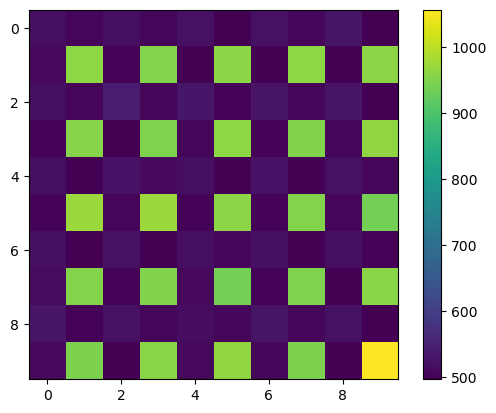

In [5]:
# Look at a subset to see the bayer pattern is in the darks
plt.imshow(dark_set[0][:10,:10])
plt.colorbar()

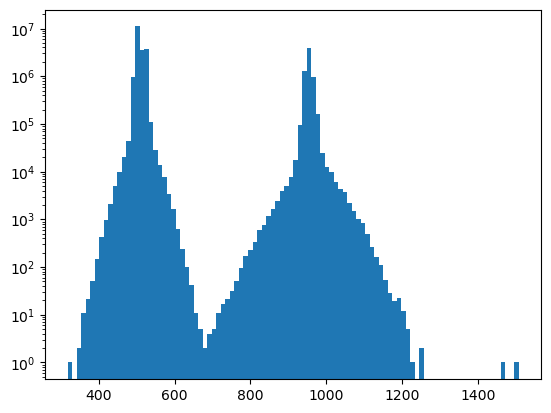

In [6]:
#Really three (two? four?) of nearly the same distribution but different tail behavior
plt.hist(dark_set[0].ravel(),bins=100)
plt.yscale('log')

### Stacking

This will read the stack images and average them with no rejection or other manipulation.

In [7]:
dark_avg = odp.simple_stack(dark_set, dtype=DTYPE, verbose=True)

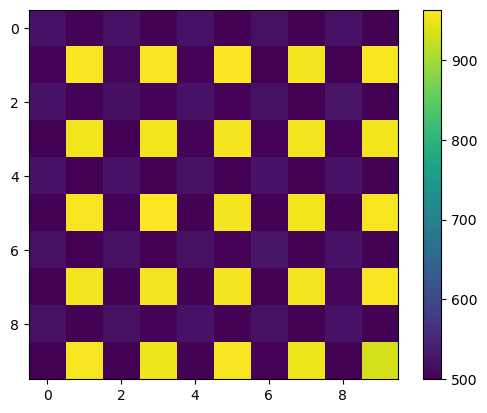

In [8]:
# Look at a subset to see the bayer pattern is in the darks
plt.imshow(dark_avg[:10,:10])
plt.colorbar()

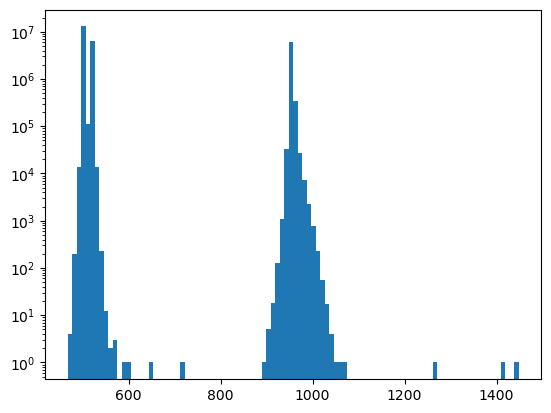

In [9]:
#Averaging kills the tails, revealing a much narrower dark/bias distribution and a few warm pixels
plt.hist(dark_avg.ravel(),bins=100)
plt.yscale('log')

### Histogram

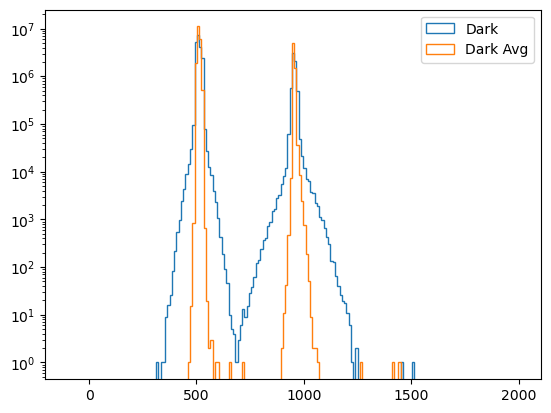

In [10]:
plt.hist(dark_set[0].ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark')
plt.hist(dark_avg.ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark Avg')
plt.yscale('log')
plt.legend()

## Flat

Flats capture nonuniform response to light in the optical system due to imperfections in the telescope/lens, dust on the sensor, or senor response itself. This corrects for effects similar to vignetting as well. Raw flats should be offset corrected with bias/darks. Flats are then normalized so that the multiplicative effect does not modify the mean intensity of a uniform image.

In [11]:
flat_set = ImageSet(flats)

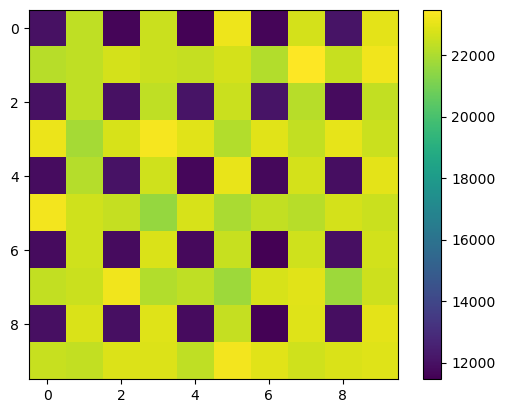

In [12]:
# Look at a subset to see the bayer pattern is in the flats
plt.imshow(flat_set[0][:10,:10])
plt.colorbar()

### Dark Subtraction

In [13]:
def dark_subtact(img, dark):
    ''' 
    This is an image sequence transformation. 
    Images in the sequence will be passed to the first argument by an ImageProcessor
    Any number of additional static arguments can be passed.
    '''
    return img - dark

In [14]:
#This is how to create an empty image sequence
flat_calib_set = odp.DiskSet('flat_calib.apy',recreate=True, dtype=DTYPE, num_img=len(flat_set), img_shape=flat_set.img_shape)

#And here is how to efficiently (multiprocessing) fill it with the result of an operation (dark_subtract) 
#using map() syntax over the flat_set, and specifying and output_set to contain the per-image results
with odp.ImageProcessor(nproc=16) as proc:
    proc.map(dark_subtact, flat_set, args=(dark_avg,), output_set=flat_calib_set, verbose=True)

100%|███████████████████████████████████████████| 50/50 [00:07<00:00,  6.34it/s]


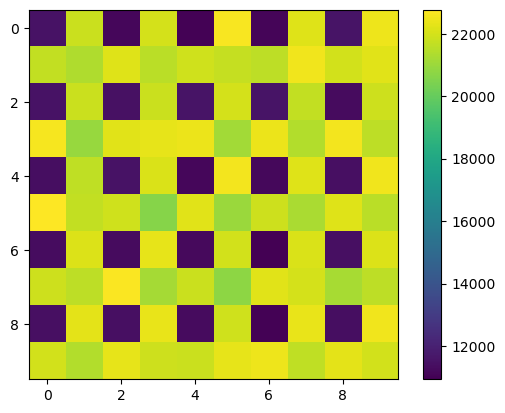

In [15]:
# Look at a subset to see the bayer pattern is in the calibrated flats
plt.imshow(flat_calib_set[0][:10,:10])
plt.colorbar()

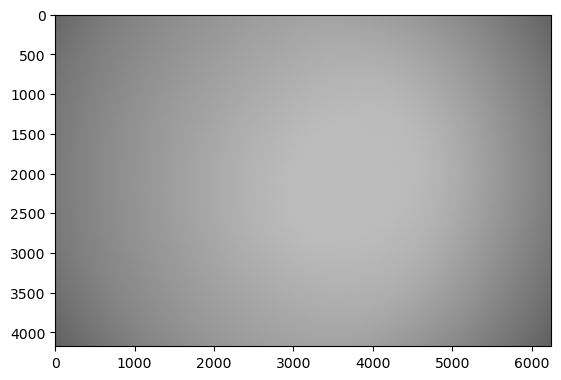

In [18]:
odp.display_rgb(flat_calib_set[0])

### Stacking

In [19]:
flat_avg = odp.simple_stack(flat_calib_set, dtype=DTYPE, verbose=True)

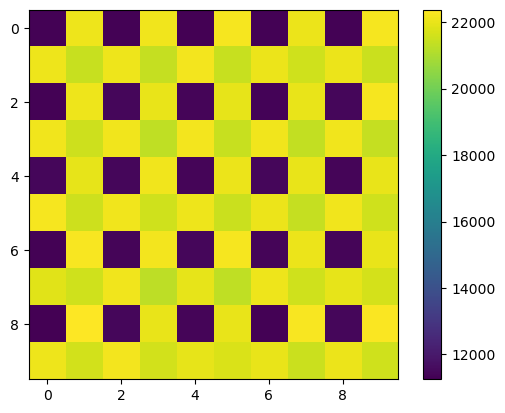

In [20]:
# Look at a subset to see the bayer pattern is in the calibrated flats
plt.imshow(flat_avg[:10,:10])
plt.colorbar()

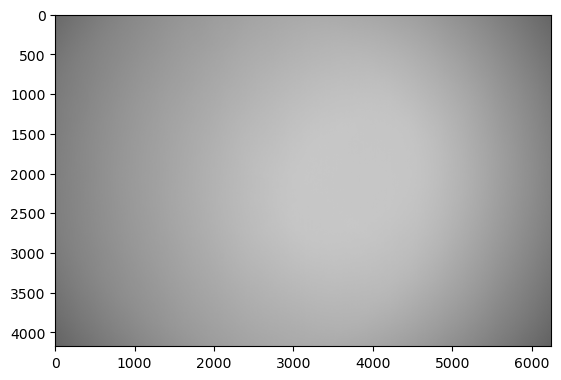

In [21]:
odp.display_rgb(flat_avg)

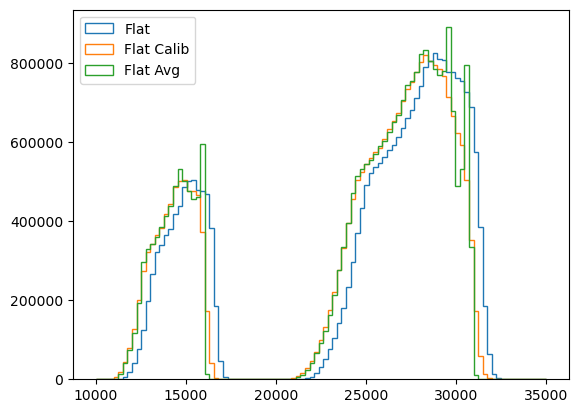

In [22]:
plt.hist(flat_set[0].ravel(), bins=np.linspace(10000,35000,100), histtype='step',label='Flat')
plt.hist(flat_calib_set[0].ravel(), bins=np.linspace(10000,35000,100), histtype='step',label='Flat Calib')
plt.hist(flat_avg.ravel(), bins=np.linspace(10000,35000,100), histtype='step',label='Flat Avg')
plt.legend()

### Normalization

Normalization is twofold: equalize color channels and make overall scale factor average to unity.

In [23]:
R,G1,G2,B = odp.debayer_simple(flat_avg, channels=True)

flat_norm = odp.rebayer_simple(R/R.mean(),G1/G1.mean(),G2/G2.mean(),B/B.mean())

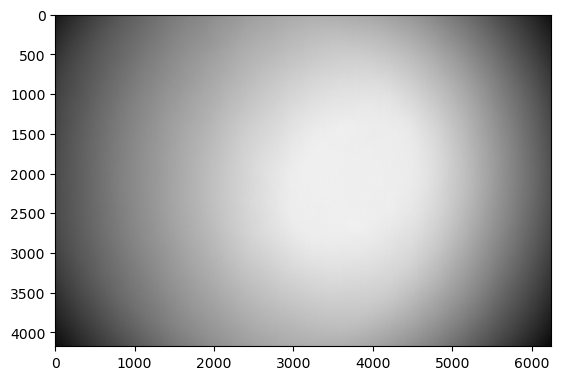

In [24]:
odp.display_rgb(flat_norm)

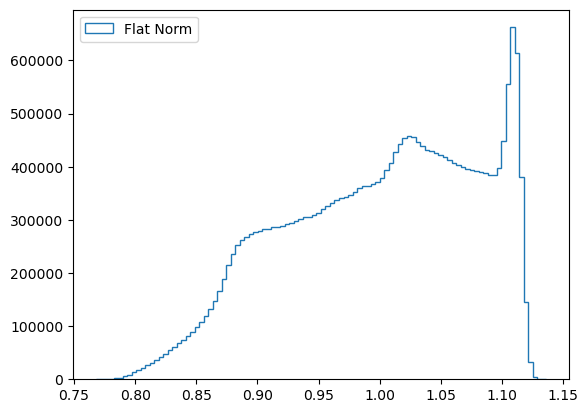

In [25]:
#That really cleans up the flat histogram! This shape surely has something to do with the optics
plt.hist(flat_norm.ravel(), bins=100, histtype='step',label='Flat Norm')
plt.legend()

# Light Image Processing

This is the real data. It needs to be calibrated, followed by a star detection step and identification of alignment transformations. Only then can the images be successfully stacked.

In [26]:
light_set = ImageSet(lights)

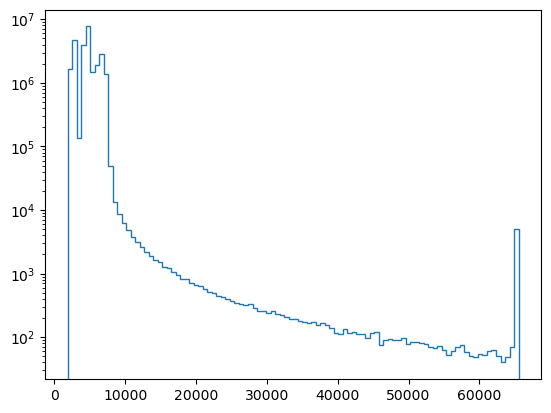

In [27]:
#AHHH REAL DATA
plt.hist(light_set[0].ravel(), bins=100, histtype='step')
plt.yscale('log')

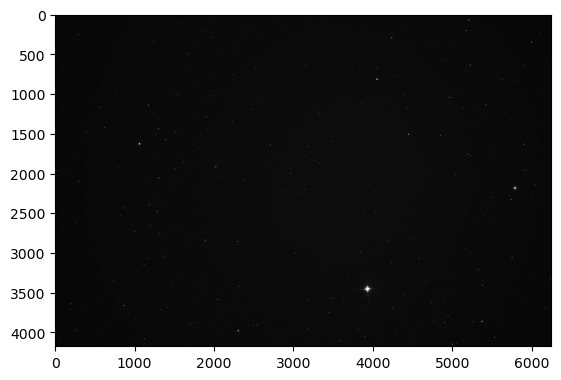

In [28]:
# It's linear, so not much to see
odp.display_rgb(light_set[0])

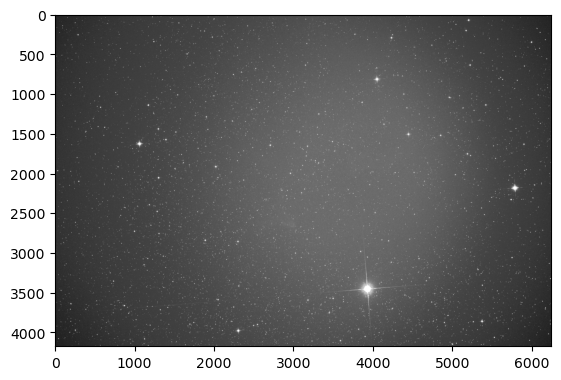

In [29]:
# But, it's easy to apply some autoscaling 
odp.display_rgb(light_set[0], scale='auto')

## Dark & Flat Calibration

In [30]:
dark_master = dark_avg
flat_master = flat_norm

def calibrate_light_img(img):
    '''
    This is another sequence transformation, doing both dark and flat calibration
    Arguments are optional, closures work just fine. 
    '''
    return (img - dark_master) / flat_master

In [31]:
light_calib_set = odp.DiskSet('light_calib.apy',recreate=True, dtype=DTYPE, num_img=len(light_set), img_shape=light_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(calibrate_light_img, light_set, output_set=light_calib_set, verbose=True)

100%|█████████████████████████████████████████| 149/149 [00:21<00:00,  6.86it/s]


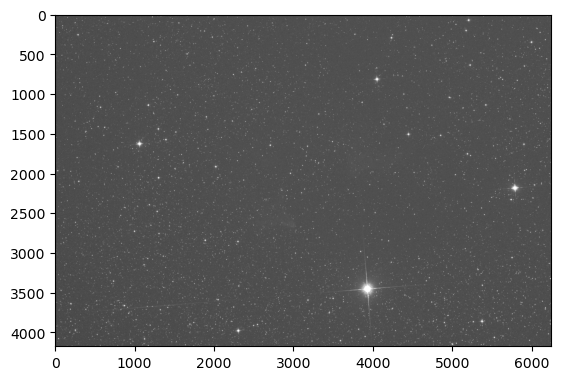

In [33]:
# The flat and dark calibration has now produced nicely calibrated light frames
odp.display_rgb(light_calib_set[0], scale='auto')

## Find Stars

Stars are the reference points for alignment, and also provide a lot of good information about the quality of the image with their shape and size. This code will identify the 250 brightest stars that meet some basic criteria of not being too distorted or clipping.

In [34]:
def star_finder(img, **kwargs):
    '''
    This is another image sequence transformation.
    Unlike the others, this does not return an image, but rather information about identified stars.
    find_stars could be used directly on an RGB image, but we debayer on the fly here and use the green channel (default).
    '''
    return odp.find_stars(odp.debayer_full(img), **kwargs)

Fit(2223): Optimization terminated successfully.
FWHM 94.60829157699173 ECC 0.9243105083537546 SNR 7.4280125620819275 LVL 176725.20943698756 DIST 81.51782938618882
Candidate Excluded
Fit(2549): Optimization terminated successfully.
FWHM 352.7997606663294 ECC 0.9735060736921637 SNR 1.6671799897945756 LVL 605107.8988781058 DIST 217.95624021787566
Candidate Excluded
Fit(1444): Optimization terminated successfully.
FWHM 81.49299204555922 ECC 0.7880813289197582 SNR 2.968929676882172 LVL 118556.8371681892 DIST 32.376922372648224
Candidate Excluded
Fit(1585): Optimization terminated successfully.
FWHM 55.18577593619864 ECC 0.8227723766521933 SNR 48.62593983360233 LVL 71296.7041332675 DIST 19.321904552334296
Candidate Excluded
Fit(1077): Optimization terminated successfully.
FWHM 52.08975542312315 ECC 0.8984468300035965 SNR 14.431269648359855 LVL 63876.03653561639 DIST 19.24236931275395
Candidate Excluded
Fit(411): Optimization terminated successfully.
FWHM 19.71605227333381 ECC 0.402425826687

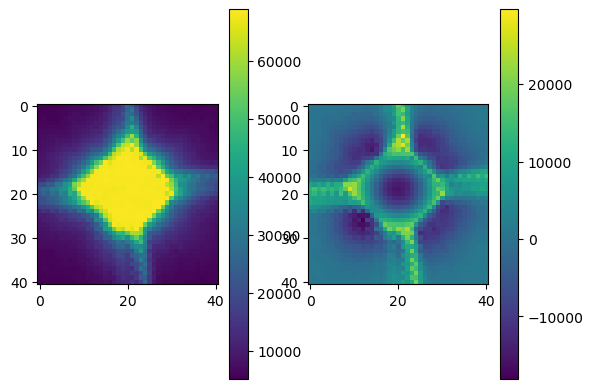

array([[5.79395526e+03, 2.18797757e+03, 1.97160523e+01, 7.92171172e+04,
        4.35668565e+03, 4.02425827e-01]])

In [35]:
star_finder(light_calib_set[0], patch_radius=20, snr_min=5, num_stars=1, verbose=True) # For a demo

In [36]:
# Image transformations that have non-image results can simply return them. 
# kwargs not known to map are passed through

with odp.ImageProcessor(nproc=16) as proc:
    reg_stars = proc.map(star_finder, light_calib_set, num_stars=250, patch_radius=20, snr_min=5, verbose=True)

100%|█████████████████████████████████████████| 149/149 [04:55<00:00,  1.98s/it]


Image 0 FWHM 4.772 ECC 0.538


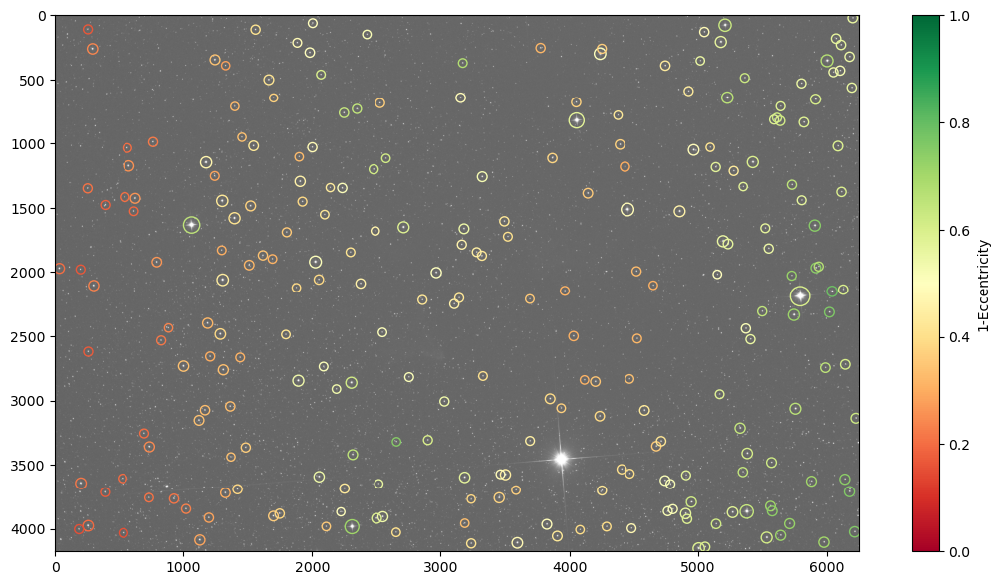

In [37]:
from matplotlib import colormaps
cmap = colormaps['RdYlGn']

for i,(img,stars) in enumerate(zip(light_calib_set,reg_stars)):
    print(f'Image {i} FWHM {np.mean(stars[:,2]):0.3f} ECC {np.mean(stars[:,5]):0.3f}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    sc = plt.scatter(stars[:,0], stars[:,1], s=10*stars[:,2], fc='none', ec=cmap(1.0-stars[:,5]))
    plt.colorbar(sc,label='1-Eccentricity')
    sc.set_cmap(cmap)
    sc.set_clim(0,1)
    plt.show()
    plt.close()
    break

## Find Constellations

Image alignment has a huge search space. It helps immensely if there's a quick way to identify the rough offset and orientation of the images before throwing the problem to a least-squares minimization routine. To achieve that, I leverage the fact that triangles have a hashable representation that is position and rotation invariant in the tuple of side lengths ordered greatest to least. Generating triangles from nearby stars in two images and putting those triangles' ordered side lengths into a KD-tree allowed to efficient checking for matching triangles in two images, with each pair capable of giving the relative orientation. 

In [38]:
with mp.Pool(16) as pool:
    reg_consts = pool.map(odp.build_constellations,reg_stars)

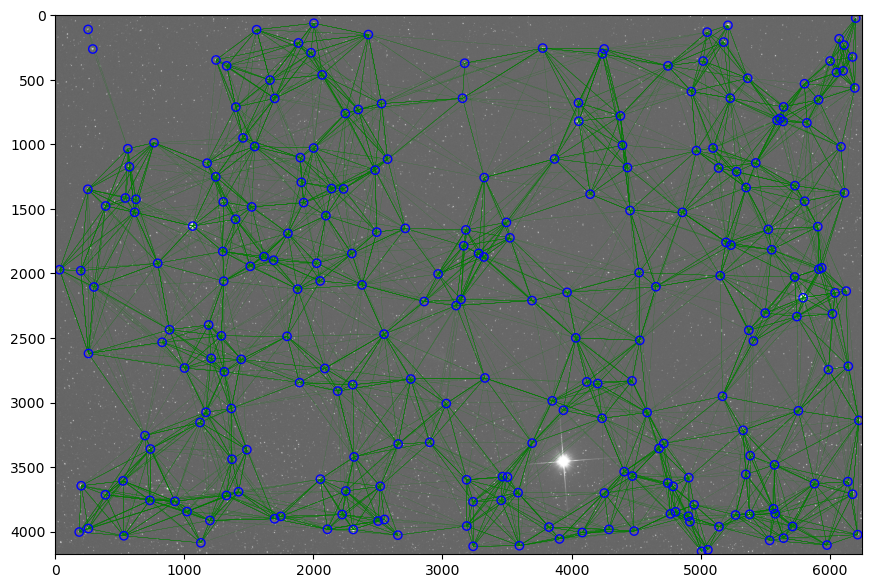

In [39]:
for i,(img,stars,tris) in enumerate(zip(light_calib_set,reg_stars,reg_consts)):
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    odp.draw_constellations(tris, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars[:,0], stars[:,1], fc='none', ec='b')
    plt.show()
    plt.close()
    break

## Find Alignment Transformations

Find the matching triangles, generate positions of matching stars in both images, and then find a transformation that aligns one to the other.

In [40]:
ref_idx = 0

import itertools
import functools

class ref_skip:
    '''For a starmap operation, this can wrap a function to skip processing a specific index and return 
       a fixed value (usually None) instead. Assumes whatever you would have iterated over with the bare 
       function is instead wrapped in enumerate'''
    
    def __init__(self, f, ref_idx, ref_val=None):
        self.f = f
        self.ref_idx = ref_idx
        self.ref_val = ref_val
        
    def __call__(self, i, args, **kwargs):
        if i == self.ref_idx:
            return self.ref_val
        else:
            return self.f(*args, **kwargs)

ft = functools.partial(odp.find_transformation, max_iter=10)

with mp.Pool(16) as pool:
    const_pairs = pool.starmap(ref_skip(odp.find_corresponding_constellations,ref_idx), enumerate(zip(itertools.repeat(reg_consts[ref_idx]),reg_consts)))
    star_pairs = pool.starmap(ref_skip(odp.find_corresponding_points,ref_idx), enumerate(const_pairs))
    fit_txs = pool.starmap(ref_skip(ft,ref_idx), enumerate(star_pairs))

Image 1
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.1250501505194863
                x: [-1.033e+01  1.360e+01 -6.169e-05]
              nit: 5
            direc: [[ 5.568e-02 -1.681e-01 -2.963e-05]
                    [ 0.000e+00  0.000e+00  1.000e+00]
                    [ 4.275e-03 -1.190e-03 -6.348e-07]]
             nfev: 227
 average_distance: 0.1250501505194863
      total_stars: 222
        star_mask: [ True False ...  True  True]
The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


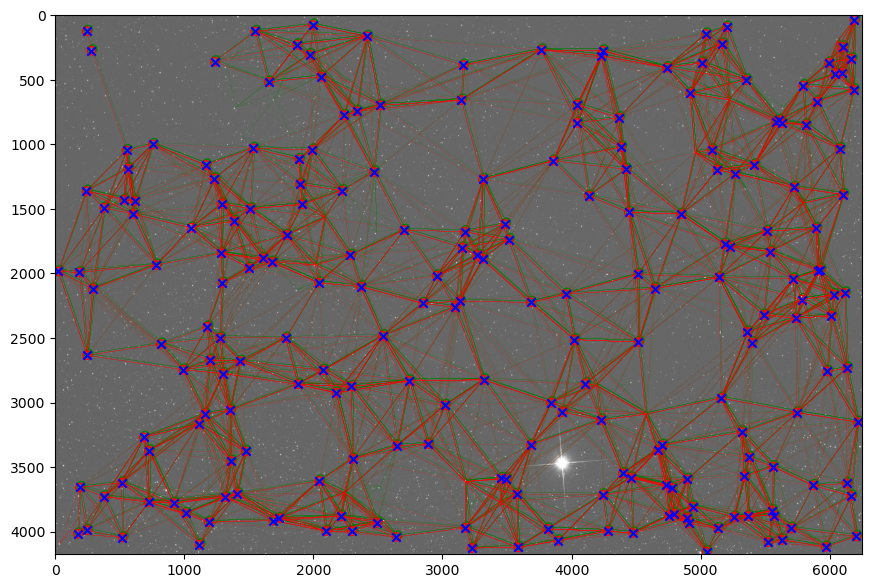

Image 2
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.473401195757735
                x: [ 6.992e+01  1.010e+02  8.711e-04]
              nit: 5
            direc: [[ 1.000e+00  0.000e+00  0.000e+00]
                    [-1.187e+00  2.197e+00  4.588e-04]
                    [-3.865e-02 -8.800e-04  1.068e-05]]
             nfev: 195
 average_distance: 0.473401195757735
      total_stars: 208
        star_mask: [ True  True ... False  True]


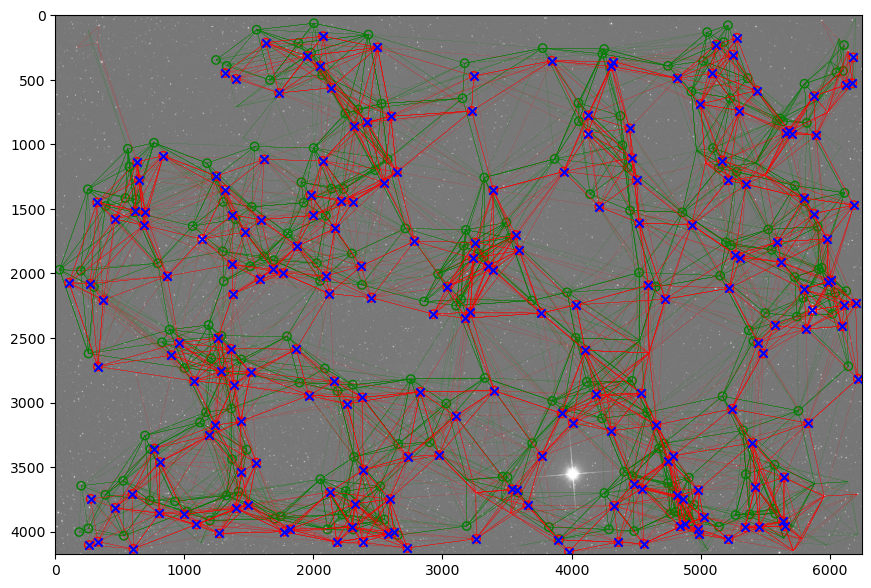

In [41]:
for i,(img,stars,tris,fit) in enumerate(zip(light_calib_set,star_pairs,const_pairs,fit_txs)):
    if ref_idx == i:
        continue
    print(f'Image {i}')
    
    print(fit)
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    stars_a,stars_b,mean_rot,mean_tx = stars
    tris_a,tris_b = tris
    odp.draw_constellations(tris_a, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_a[fit.star_mask,0], stars_a[fit.star_mask,1], fc='none', ec='g')
    odp.draw_constellations(tris_b, color='r', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_b[fit.star_mask,0], stars_b[fit.star_mask,1], fc='none', ec='r')
    stars_a_tx = odp.transform_coords(stars_a[fit.star_mask,:2],*fit.x)
    plt.scatter(stars_a_tx[:,0], stars_a_tx[:,1], c='b', marker='x')
    plt.show()
    plt.close()
    if i >= 2: break

## Image Selection

Based on metrics determined during star finding and alignment.

Text(0.5, 0, 'eccentricity')

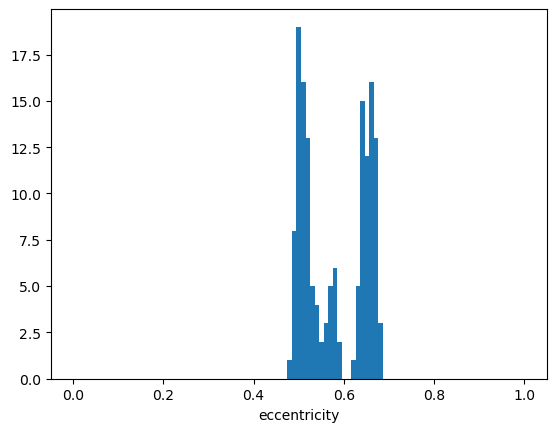

In [42]:
eccentricity = np.asarray([np.mean(star[:,5]) for star in reg_stars])
plt.hist(eccentricity,bins=np.linspace(0,1,100))
plt.xlabel('eccentricity')

Text(0.5, 0, 'fwhm')

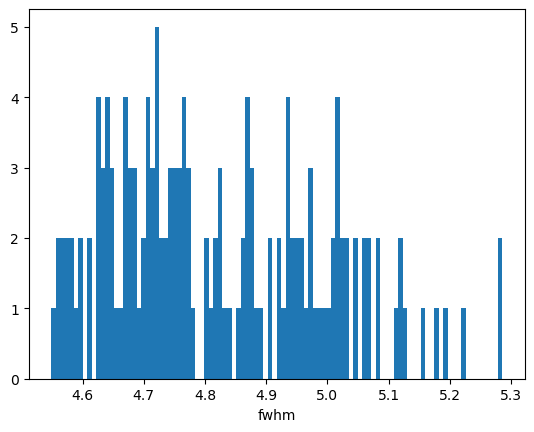

In [43]:
fwhm = np.asarray([np.mean(star[:,2]) for star in reg_stars])
plt.hist(np.clip([np.mean(star[:,2]) for star in reg_stars],0,10),bins=100)
plt.xlabel('fwhm')

Text(0.5, 0, 'total stars')

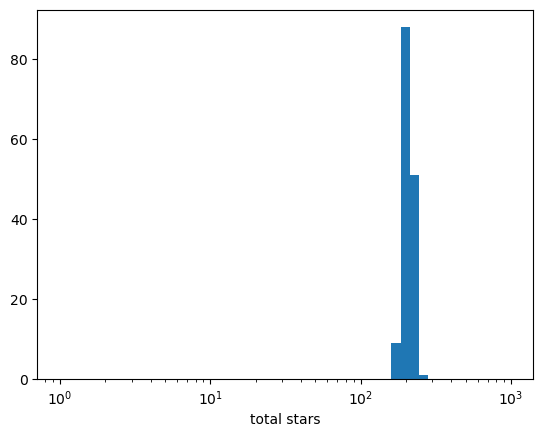

In [44]:
total_stars = np.asarray([fit.total_stars if fit else len(reg_stars[ref_idx]) for fit in fit_txs ])
plt.hist(total_stars,bins=np.logspace(0,3))
plt.xscale('log')
plt.xlabel('total stars')

Text(0.5, 0, 'average tx distance')

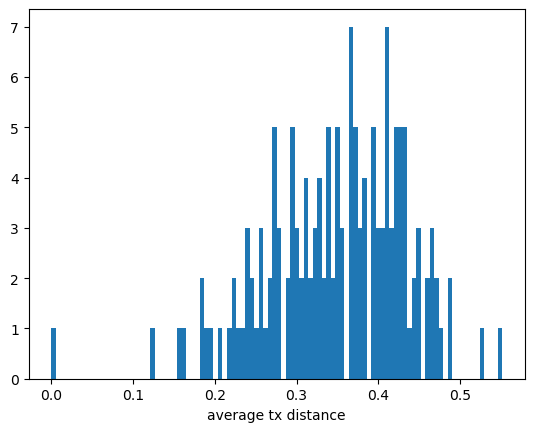

In [45]:
avg_dist = np.asarray([fit.average_distance if fit else 0.0 for fit in fit_txs ])
plt.hist(np.clip(avg_dist,0,10),bins=100)
plt.xlabel('average tx distance')

[ True  True  True  True  True  True  True False  True  True False  True
  True  True False  True  True  True  True False  True False  True  True
  True False  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True False  True
  True  True  True False False  True  True  True  True  True  True  True
  True  True  True  True  True  True  True False  True  True  True  True
 False  True  True False  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True False  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True False  True  True  True  True  True  True  True  True  True False
  True  True  True  True False  True  True  True  True  True  True  True
  True  True  True  True False  True  True False  True  True  True  True
  True  True  True False  True]
Total Lights: 149; Lights Used: 129
Rejected 7: FWHM 5.17888384796324 ECC 0.6477994829192947

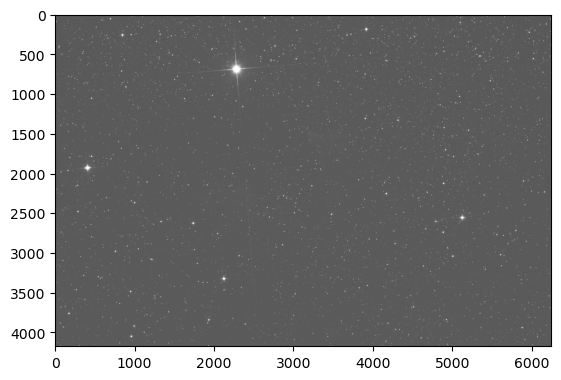

Rejected 10: FWHM 5.121756615541812 ECC 0.6715518731148443 TOT 203 DIST 0.23492642842977088


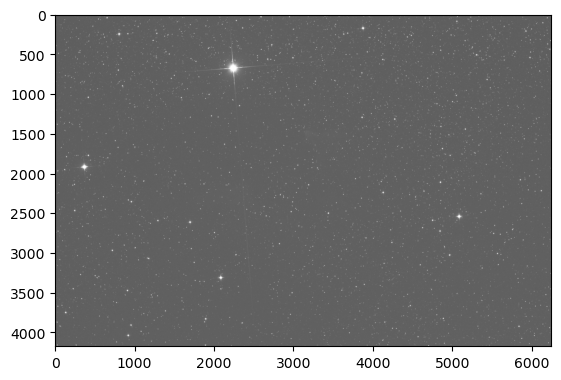

Rejected 14: FWHM 5.285449506931245 ECC 0.6352939091689737 TOT 203 DIST 0.42718369886021185


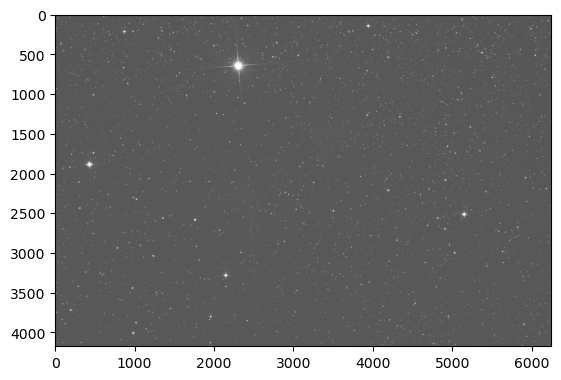

Rejected 19: FWHM 5.222247444561352 ECC 0.6408041139304048 TOT 208 DIST 0.2936190592824273


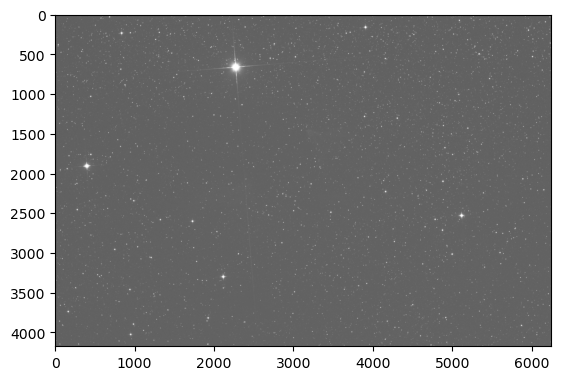

Rejected 21: FWHM 5.059636729647051 ECC 0.6260235366577521 TOT 203 DIST 0.39411304909824096


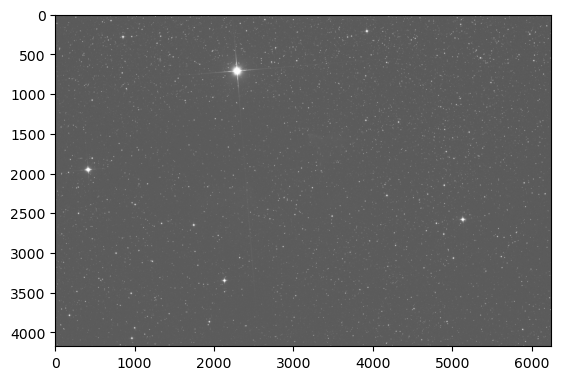

Rejected 25: FWHM 5.157451953308376 ECC 0.6521494314645131 TOT 199 DIST 0.37291368158901184


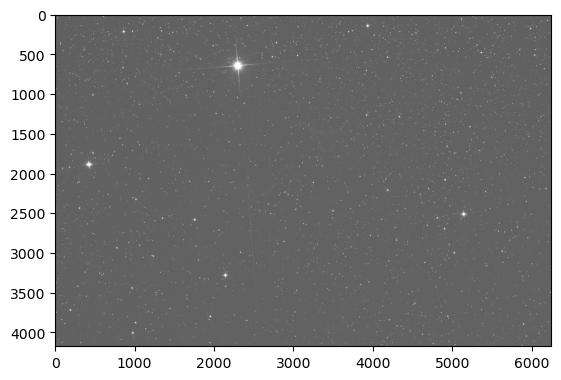

Rejected 32: FWHM 5.031805677986386 ECC 0.6415272642556938 TOT 183 DIST 0.41319847141268323


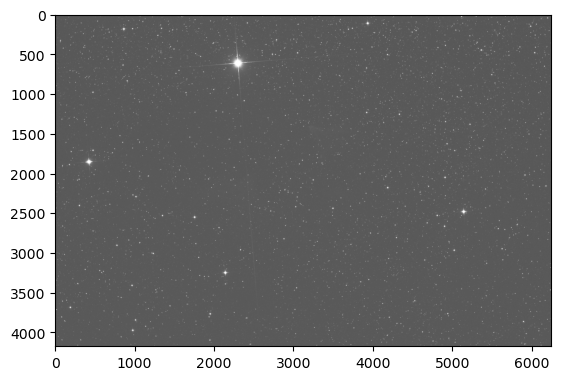

Rejected 46: FWHM 5.120073242305438 ECC 0.6397722045121845 TOT 195 DIST 0.48599066219902437


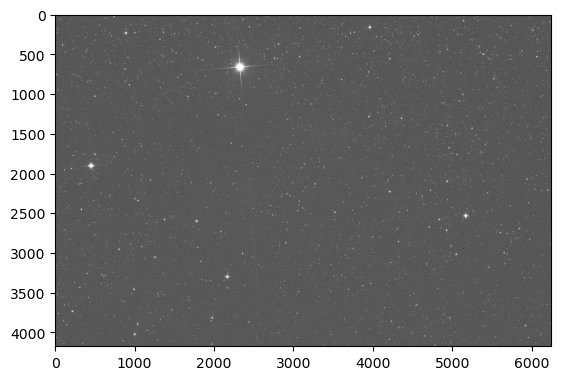

Rejected 51: FWHM 5.066632086804042 ECC 0.6463989389937371 TOT 188 DIST 0.43113804302397507


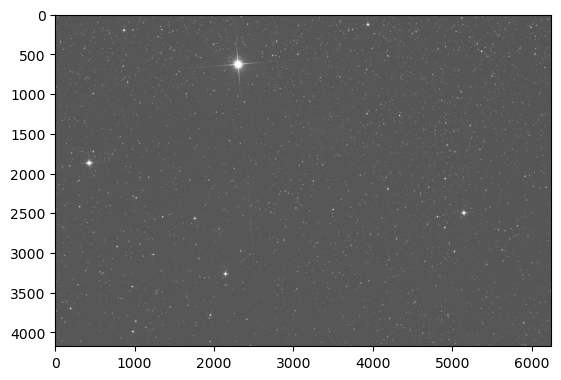

Rejected 52: FWHM 5.069119922552683 ECC 0.6301960402528549 TOT 198 DIST 0.2992697636781254


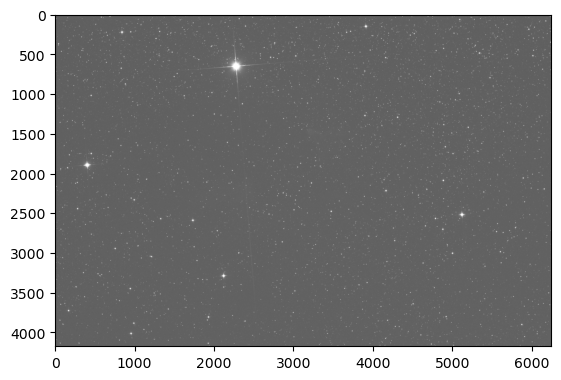

Rejected 67: FWHM 5.058169787170809 ECC 0.6414711818319981 TOT 197 DIST 0.39900490825945184


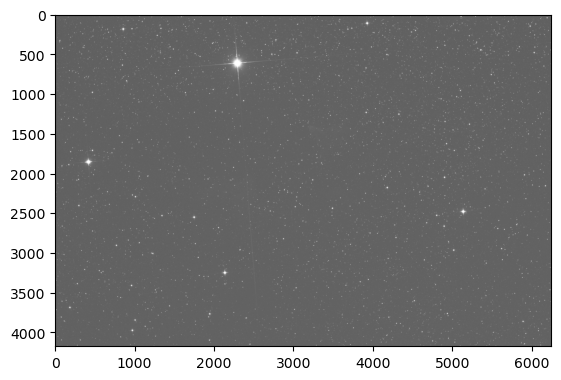

Rejected 72: FWHM 4.608390526178821 ECC 0.5107425908367085 TOT 202 DIST 0.5513114871003386


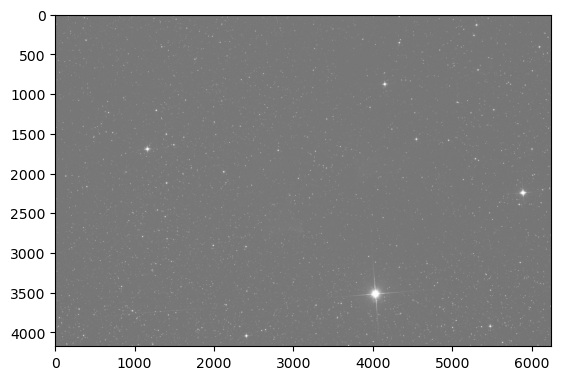

Rejected 75: FWHM 5.189872292807406 ECC 0.6317559977248691 TOT 207 DIST 0.33631076213879657


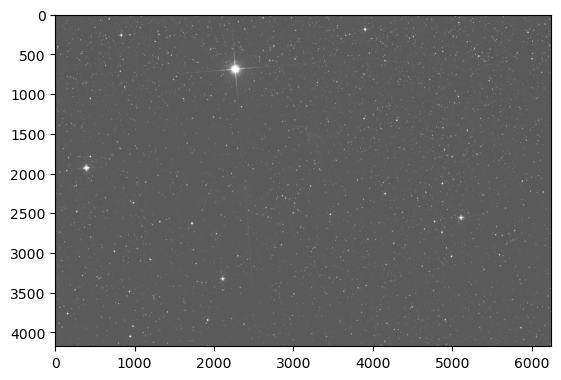

Rejected 93: FWHM 5.045537446453465 ECC 0.6585880480395506 TOT 192 DIST 0.31395568956710945


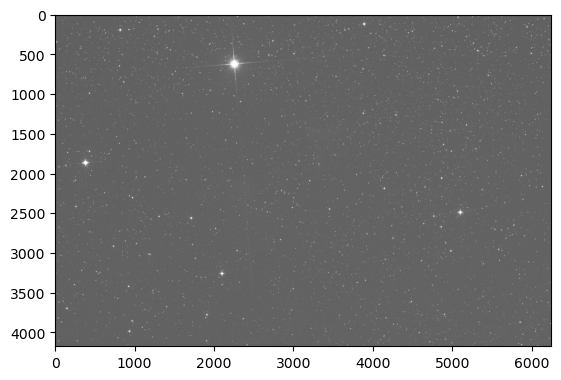

Rejected 109: FWHM 5.285514367002385 ECC 0.62985200085362 TOT 199 DIST 0.33658239519248206


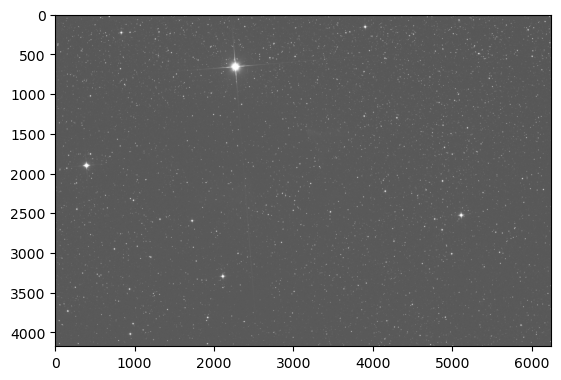

Rejected 119: FWHM 5.084051142331844 ECC 0.6499763606169324 TOT 194 DIST 0.4009287498479703


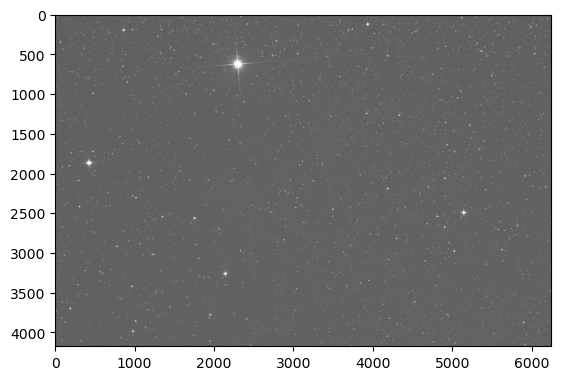

Rejected 124: FWHM 5.115930282811524 ECC 0.6305109749489016 TOT 169 DIST 0.4780125629609052


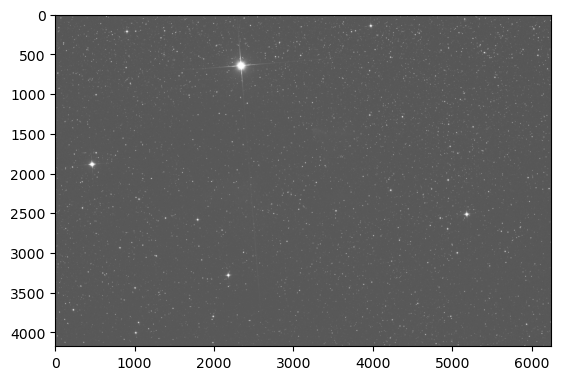

Rejected 136: FWHM 5.124071548031969 ECC 0.6721820307709856 TOT 201 DIST 0.25575604978637817


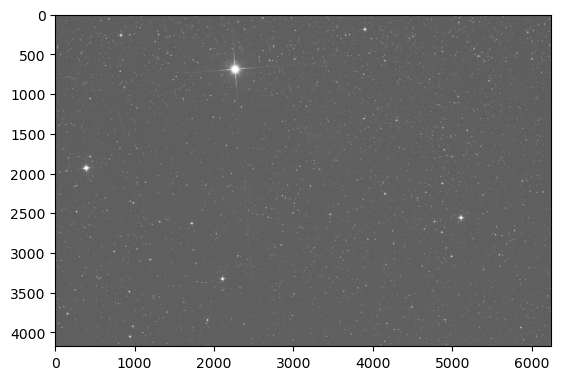

Rejected 139: FWHM 5.083755800020484 ECC 0.6498111780776846 TOT 208 DIST 0.33051482626668094


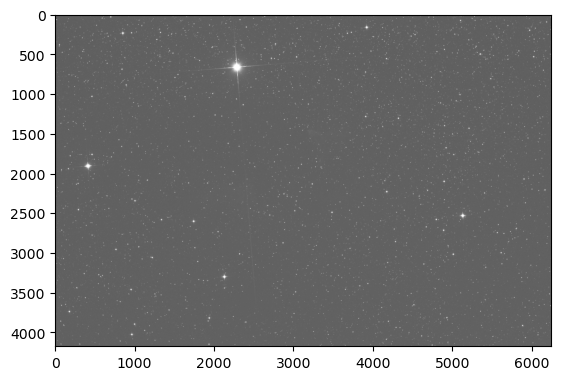

Rejected 147: FWHM 5.044704588168307 ECC 0.6727442943326702 TOT 193 DIST 0.255958880621597


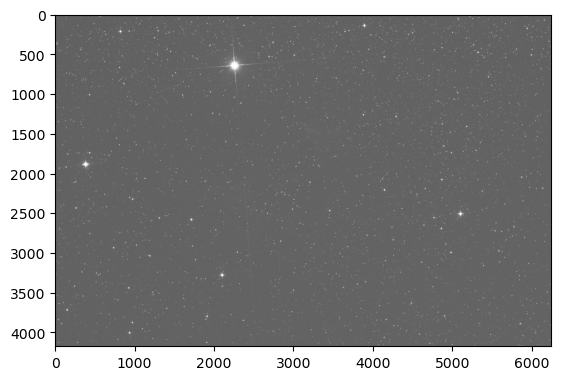

In [46]:
def median_sigma_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return np.abs(values - m) < sigmas*s

def median_sigma_max_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return values - m < sigmas*s
    
def median_sigma_min_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return m - values < sigmas*s

star_selection = median_sigma_max_cut(fwhm, 1.5) & median_sigma_min_cut(eccentricity, 1.5)
fit_selection = (total_stars >= 10) & median_sigma_max_cut(avg_dist, 2)
selection = star_selection & fit_selection
print(selection)
print(f'Total Lights: {len(selection)}; Lights Used: {np.count_nonzero(selection)}')
for i,sel in enumerate(selection):
    if not sel:
        print(f'Rejected {i}: FWHM {fwhm[i]} ECC {eccentricity[i]} TOT {total_stars[i]} DIST {avg_dist[i]}')
        odp.display_rgb(light_calib_set[i],scale='linear',clip_sigmas=5)
        plt.show()
        plt.close()

## Transform Images

Here there's a decision: keep track of the bayer matrix somehow after transforming the underlying pixel array, or simply debayer and do a bilinear interpolation to transform. Haven't implemented the former.

In [356]:
transformed_shape = light_calib_set.img_shape + (3,)

light_regtx = odp.DiskSet('light_calib_reg.apy', recreate=True, dtype=DTYPE, num_img=np.count_nonzero(selection), img_shape=transformed_shape)

def debayer_and_transform(img, fit_tx, **kwargs):
    return odp.image_transform_chunked(odp.debayer_full(img), fit_tx, drizzle=False, **kwargs)

# We can skip images with a selection mask and iterate over other arguments along with the set!
with odp.ImageProcessor(nproc=16) as proc:
    proc.map(debayer_and_transform, light_calib_set, fit_txs, output_set=light_regtx, selection=selection, verbose=True)

100%|█████████████████████████████████████████| 129/129 [01:57<00:00,  1.10it/s]


## Stacking (Winsor Implementation)

In [48]:
summed,counts = odp.winsor_stack(light_regtx, span=500, nproc=8, verbose=True, return_counts=True)

Stacking with winzor quantiles [0.030, 0.970]
Total jobs to run: 117


Winsor quantiles: 100%|███████████████████████| 117/117 [03:44<00:00,  1.91s/it]


In [49]:
np.count_nonzero(counts==0)

np.int64(0)

In [50]:
np.count_nonzero(np.isnan(counts))

np.int64(0)

In [51]:
stacked = summed/np.clip(counts,1,None)

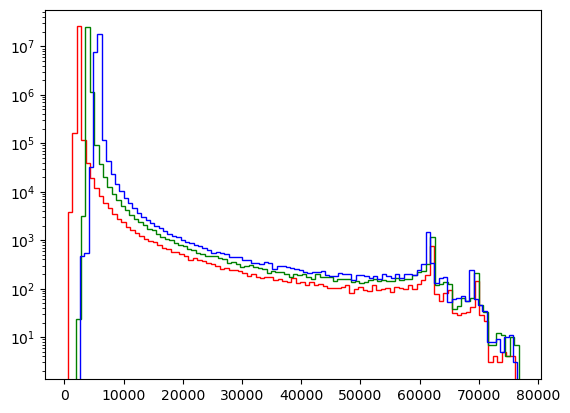

In [52]:
odp.show_hist(stacked)

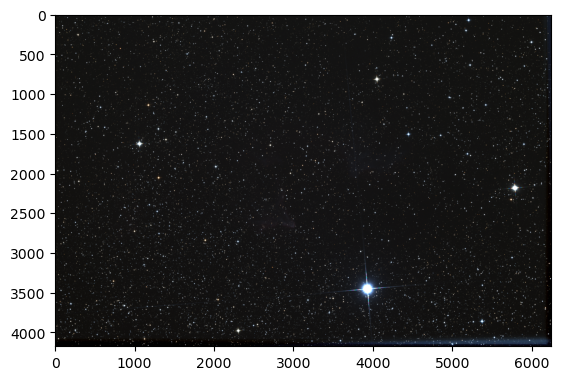

In [54]:
odp.display_rgb(stacked, scale='auto')

# ImageMM

After reading this https://arxiv.org/pdf/2501.03002 its clear that maximum likeihood extraction on the image set is the way to go. I'll start with my registered and transformed images with no drizzle so everthing is aligned to the same pixel grid.

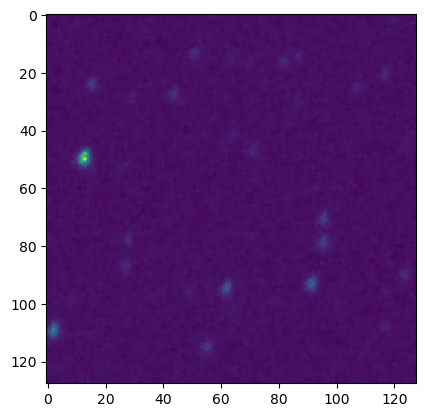

In [352]:
PATCH_SIZE = 128
PATCH_X = 10
PATCH_Y = 10

I = light_regtx[0][PATCH_X*PATCH_SIZE:(PATCH_X+1)*PATCH_SIZE,PATCH_Y*PATCH_SIZE:(PATCH_Y+1)*PATCH_SIZE,1]
plt.imshow(I)

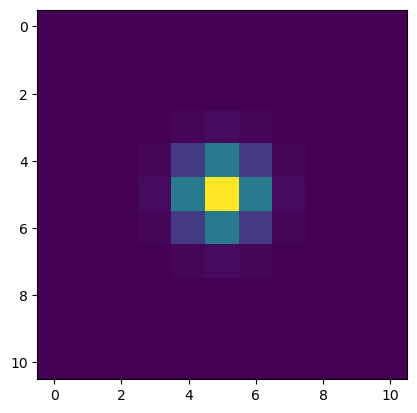

In [505]:
X, Y = np.meshgrid(range(11), range(11), indexing='ij')
PSF = odp.gauss_profile(X, Y, 5, 5, 0.75, 0.75, 0, 1, 0)
PSF /= np.sum(PSF)
plt.imshow(PSF) #fake PSF

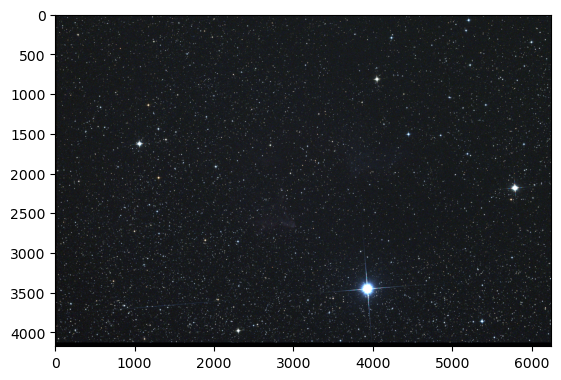

In [506]:
odp.display_rgb(np.nan_to_num(light_regtx[30]), scale='auto')

In [507]:
#odp.find_stars(np.nan_to_num(light_regtx[30]), patch_radius=21, snr_min=5, verbose=True)

Max-likelihood extraction on 129 images


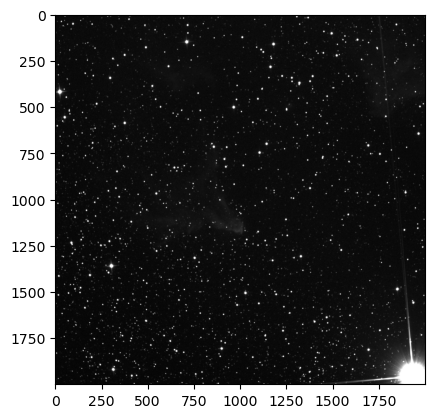

Starting iteration 1
128.9356 131.85922 0.97799486
Starting iteration 2
128.9356 128.93895 1.000013
Err: 0.022755147889256477
Starting iteration 3
128.9356 128.93774 1.0000025
Err: 0.0003102295158896595
Starting iteration 4
128.9356 128.93707 1.0000005
Err: 0.0001383344642817974
Starting iteration 5
128.9356 128.93675 0.9999994
Err: 7.959820504765958e-05


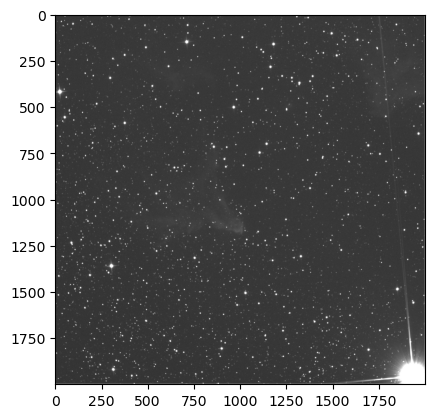

In [519]:
#ImageMM algo

CH = 2

KAPPA = 2.0
TOL = 1e-4

from scipy.signal import fftconvolve

def conv2(x, k):
    return fftconvolve(x, k, mode='same')

def conv2_T(x, k):
    # Adjoint convolution: correlate with flipped kernel
    k_flip = np.flip(k)
    return fftconvolve(x, k_flip, mode='same')

def y_t(t):
    return light_regtx[t][1500:3500,2000:4000,CH] 

# for some pixel-level statistics
y_sum = np.zeros_like(y_t(0))
norm = np.zeros_like(y_sum)

for t,idx in enumerate(idx for idx,z in enumerate(selection) if z):
    y = y_t(t)
    # images may have missing data
    masked = np.logical_or(np.isnan(y), y <= 0)
    y[masked] = -1
    y_sum += y
    norm += np.where(masked,0,1)
    #if t>=49: break
        
n_t = t+1
print(f'Max-likelihood extraction on {n_t} images')

# why not initialize to a naive stack?
x_guess = y_sum/norm

display_kwargs = dict(scale='auto', auto_sigma=2, auto_offset=0.5)

start_latent = x_guess.copy()
start_img = odp.display_rgb(x_guess, plot=False, **display_kwargs)
plt.imshow(start_img, cmap='gray')
plt.show()
plt.close()

u_prev = None

for k in range(1,20): 
    
    print(f'Starting iteration {k}')
    
    # using the same PSF for each image for now
    F = PSF
    # so we can precompute this
    Fx = conv2(x_guess, F)
    
    num = np.zeros_like(x_guess)
    den = np.zeros_like(x_guess)

    # Compute num and den for update image u_k = (sum F_t^T W_t y_t) / (sum F_t^T W_t F_t x_k-1)
    for t in range(n_t):
        # the paper chose to write this as a more general matrix operation on a 1D image, which is impossible to implement
        # i'll use discrete ffts to do fast convolutions on 2d images without blowing up the memory requirements
        
        # the image, in 2d instead of the 1d notation from the paper
        y = y_t(t)

        # images may have missing data
        masked = np.logical_or(np.isnan(y), y <= 0)
        y[masked] = -1
        #print(f'Min {np.min(y[~masked])} Max {np.max(y[~masked])} Mean {np.mean(y[~masked])}')
        
        # this is assuming the variance of the signal is the signal
        # there's some overall proprtionality here, but it would (?) cancel out in the numerator and denominator
        W = np.where(masked,0,1)/y 
        
        num += conv2_T(W * y, F) 
        den += conv2_T(W * Fx, F) # precomputed Fx

    den = np.maximum(den, 1e-12)
    u_k = np.clip(num / den, 1/KAPPA, KAPPA)
    print(np.mean(num),np.mean(den),np.mean(u_k))

    # Check convergence of clipped update image
    if u_prev is not None:
        diff = np.mean(np.abs(u_k - u_prev))
        print(f'Err: {diff}')
        if diff > 0 and diff < TOL:
            break
    u_prev = u_k

    # Multiplicative update: x_k = x_{k-1} ⊙ ū_k
    x_guess *= u_k
    x_guess = np.maximum(x_guess, 0.0)
    
    if k % 5 == 0:
        odp.display_rgb(x_guess, **display_kwargs)
        plt.show()
        plt.close()

end_latent = x_guess.copy()
end_img = odp.display_rgb(x_guess, plot=False, **display_kwargs)
plt.imshow(end_img, cmap='gray')
plt.show()
plt.close()

In [520]:
def autostretch(img):
    blackpoint,whitepoint = np.quantile(img,[1e-3,1-1e-5])
    print(blackpoint,whitepoint)
    med,std = np.median(img),np.std(img)
    return odp.ghs(img, low_point=blackpoint, high_point=whitepoint, symmetry_point=med+std*0.1, stretch_factor=5)

5583.104491699219 61790.87500093751


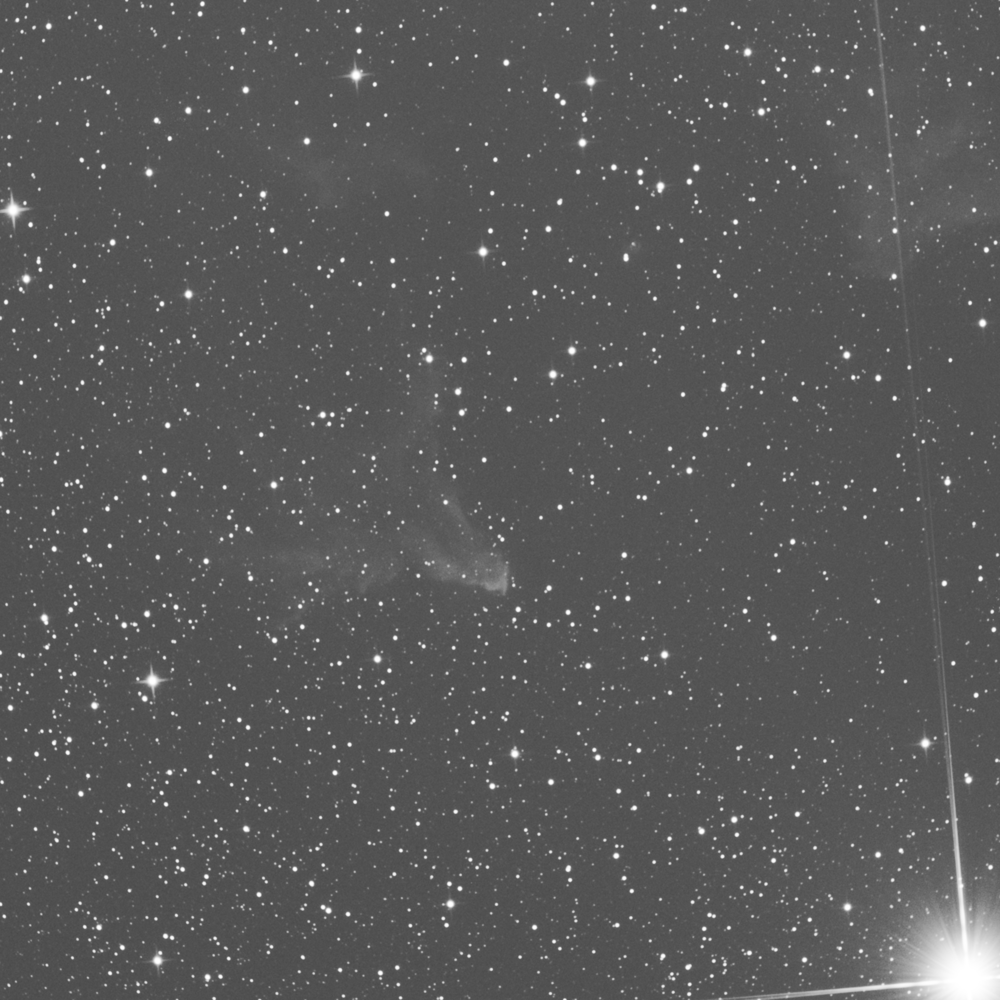

<Figure size 1400x700 with 0 Axes>

In [521]:
odp.linear_rgb(autostretch(start_latent), save='start_latent.png', plot=False)

5298.685056152343 62987.34853414731


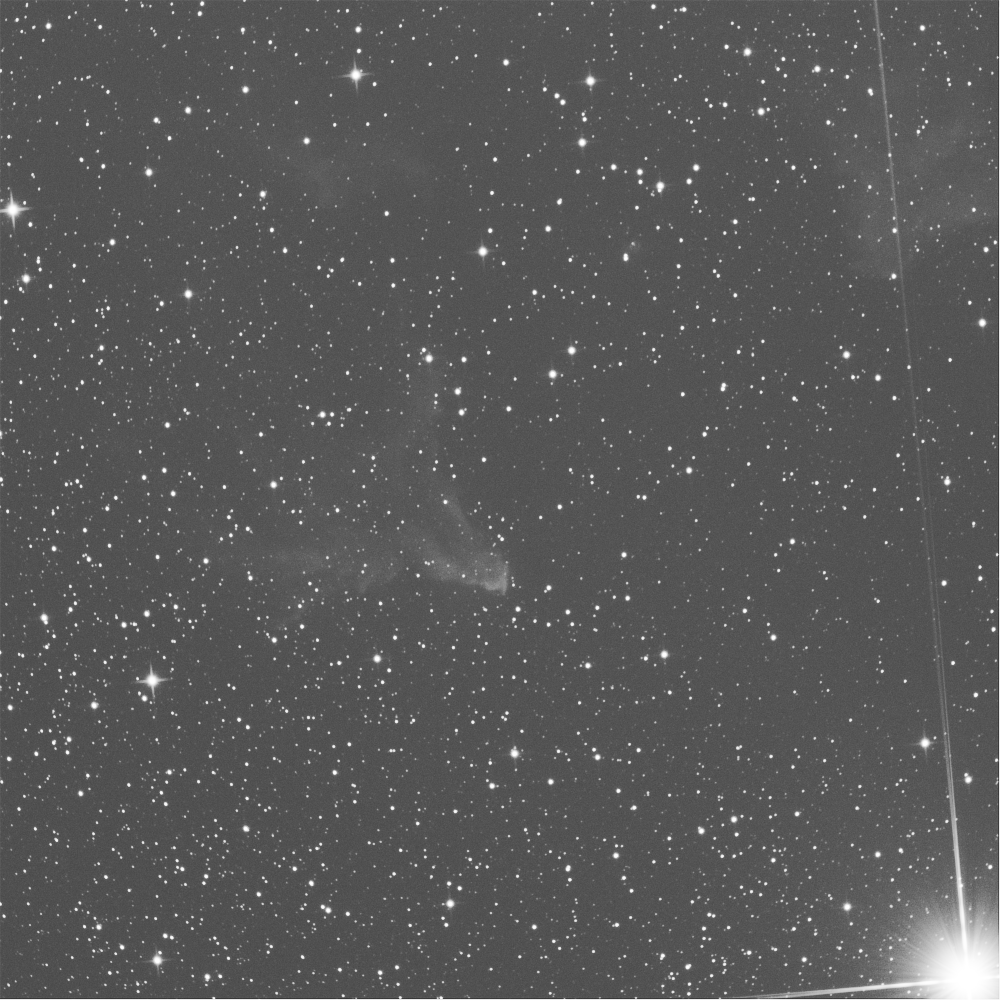

<Figure size 1400x700 with 0 Axes>

In [522]:
odp.linear_rgb(autostretch(end_latent), save='end_latent.png', plot=False)

In [ ]:
# DEVELOPMENT ENDS HERE! EVERYTHING BELOW IS OLD! STAY TUNED FOR MORE!

# Post-Processing

All the calibration, alignment, and stacking up to now has been pre-processing necessary to get one single image. From here the image is manipulated to arrive at something visually meaningful.

In [55]:
median_value = np.median(stacked)

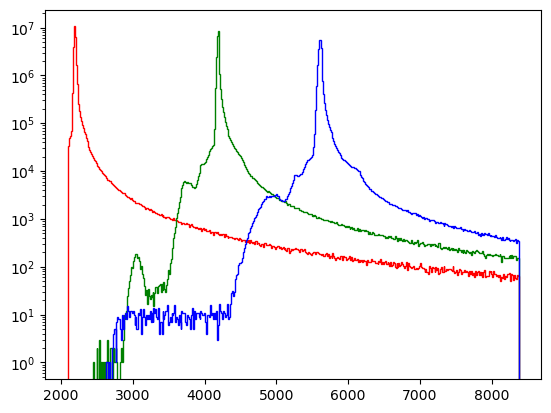

In [57]:
odp.show_hist(stacked, bins=np.linspace(median_value*0.5,median_value*2,500))
plt.yscale('log')

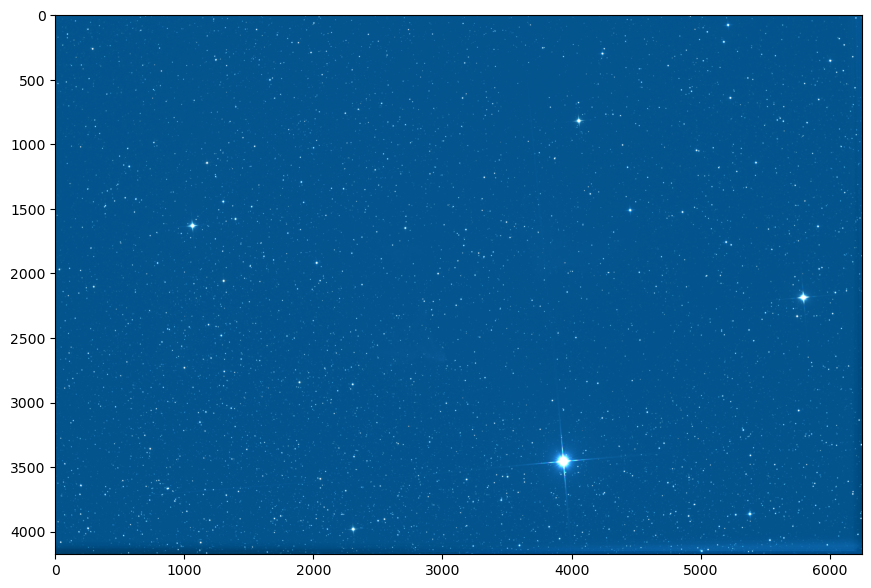

In [62]:
odp.linear_rgb(stacked, lower_limit=median_value*0.5, upper_limit=median_value*2, quality=95)

## Background Extraction

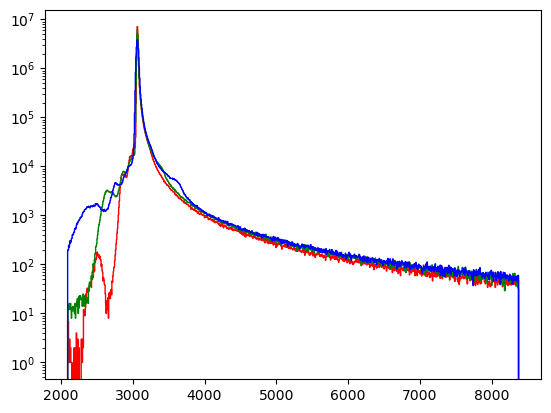

In [63]:
stacked_bkg,bkg = odp.polyfit_bkg_extract(stacked,order=5,return_bkg=True)
odp.show_hist(stacked_bkg, bins=np.linspace(median_value*0.5,median_value*2,1000))

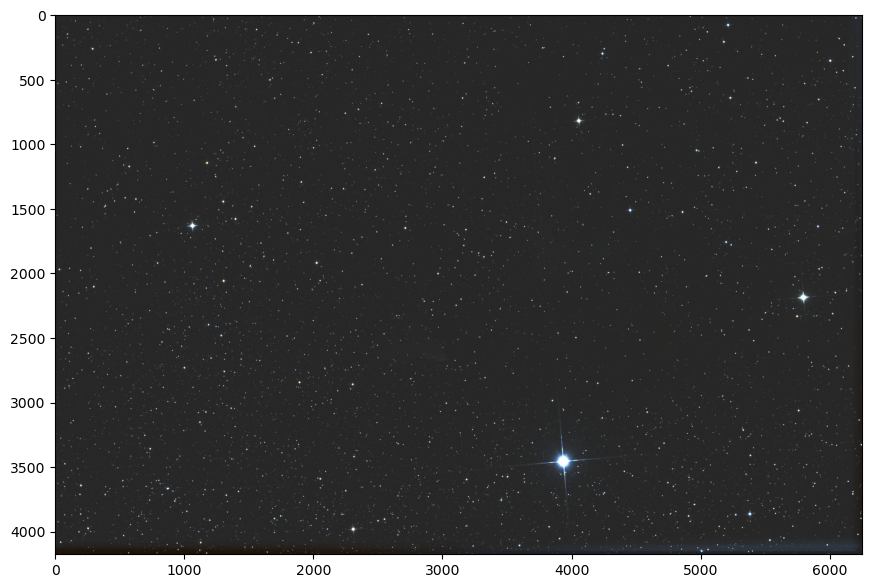

In [64]:
odp.linear_rgb(stacked_bkg, lower_limit=median_value*0.5, upper_limit=median_value*2, quality=95)

## Equalize

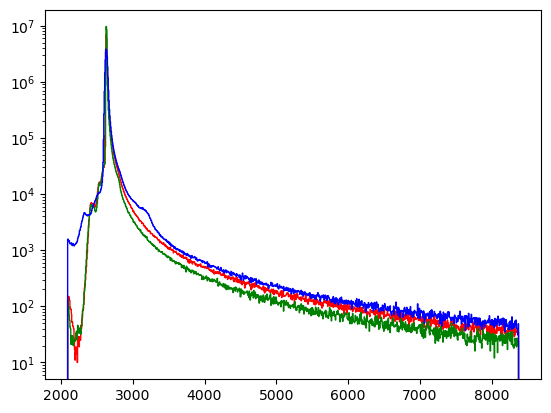

In [65]:
stacked_bkg_eq_base,med,sig  = odp.equalize_img(stacked_bkg, get_stats=True)
odp.show_hist(stacked_bkg_eq_base, bins=np.linspace(median_value*0.5,median_value*2,1000))

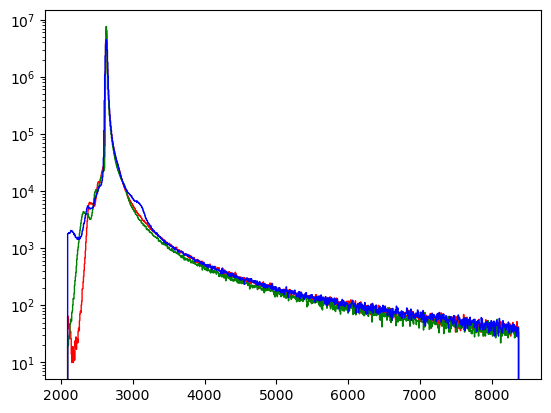

In [66]:
# The tails on the high end should be basically gray 
# The last step only equalized the background peaks
#scale = np.asarray([1.15,0.985,1.0],dtype=DTYPE)
scale = np.asarray([1.1,1.5,0.85],dtype=DTYPE)
stacked_bkg_eq = stacked_bkg_eq_base*scale-med*(scale-1)
odp.show_hist(stacked_bkg_eq, bins=np.linspace(median_value*0.5,median_value*2,1000))

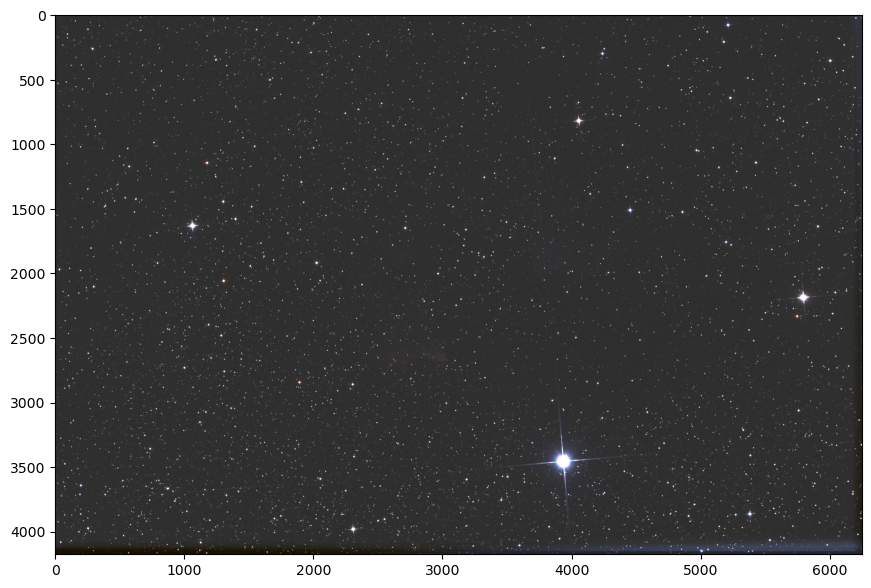

In [67]:
odp.linear_rgb(stacked_bkg_eq, lower_limit=median_value*0.5, upper_limit=median_value*1.2, quality=95)

## Blackpoint and Whitepoint

Convert from arbitrary (12-16 bit) scale to represented as DTYPE to normalized [0,1] as DTYPE from here on

In [68]:
from scipy.optimize import minimize

def histogram_metrics(rgb):
    hist_median,hist_sigma = np.median(rgb),np.std(rgb)
    counts,edges = np.histogram(rgb,bins=np.linspace(hist_median-hist_sigma*2,hist_median+hist_sigma*2,500))
    centers = (edges[:-1]+edges[1:])/2
    
    fit = minimize(odp.hist_bkg_residual(centers, counts), (hist_median,hist_sigma,0,np.max(rgb)), method='Nelder-Mead')
    fit.bkg_mean,fit.bkg_sig,fit.bkg_bkg,fit.bkg_peak = fit.x
    fit.hist_median,fit.hist_sigma = hist_median,hist_sigma
    
    return fit

odp.histogram_metrics = histogram_metrics

In [69]:
hist_fit = odp.histogram_metrics(stacked_bkg_eq)
hist_fit

       message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: 11617040093007.936
             x: [ 2.633e+03 -6.483e+00 -3.164e-01  2.086e+07]
           nit: 356
          nfev: 800
 final_simplex: (array([[ 2.633e+03, -6.483e+00, -3.164e-01,  2.086e+07],
                       [ 2.633e+03, -6.483e+00, -3.164e-01,  2.086e+07],
                       ...,
                       [ 2.633e+03, -6.483e+00, -3.164e-01,  2.086e+07],
                       [ 2.633e+03, -6.483e+00, -3.164e-01,  2.086e+07]],
                      shape=(5, 4)), array([ 1.162e+13,  1.162e+13,  1.162e+13,  1.162e+13,
                        1.162e+13]))
      bkg_mean: 2633.2786477303957
       bkg_sig: -6.483418204588441
       bkg_bkg: -0.3164251340898342
      bkg_peak: 20856773.358638898
   hist_median: 2634.734
    hist_sigma: 910.29724

In [70]:
bp,wp,light_pp = odp.set_blackpoint_and_norm(stacked_bkg_eq, blackpoint=hist_fit.hist_median-BLACKPOINT_SIGMA*abs(hist_fit.bkg_sig))
print(f'Blackpoint {bp}; Whitepoint {wp}')
symmetry_point = (hist_fit.hist_median+SYMMETRY_SIGMA*abs(hist_fit.bkg_sig)-bp)/(wp-bp)
bkg_peak = (hist_fit.bkg_mean-bp)/(wp-bp)
print(f'Bkg Peak Location: {bkg_peak}; Optimal Stretch Symmetry: {symmetry_point}')

Blackpoint 2617.228657566361; Whitepoint 68602.0703125
Bkg Peak Location: 0.00024323753397739007; Optimal Stretch Symmetry: 0.00031441976269608985


## Stretching

Using the [Generalized Hyperbolic Stretch](https://www.ghsastro.co.uk/doc/tools/GeneralizedHyperbolicStretch/GeneralizedHyperbolicStretch.html) strategy.

In [71]:
ghs_args = dict(symmetry_point=symmetry_point, form=1.0)
stretch_fit = minimize(odp.optimal_ghs_stretch(bkg_peak,0.09,symmetry_point=symmetry_point,form=1.0), 1, method='Powell')
print(stretch_fit)
ghs_args['stretch_factor'], = stretch_fit.x
print(ghs_args)

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 4.5675354561087685e-30
       x: [ 6.224e+00]
     nit: 4
   direc: [[-1.185e-02]]
    nfev: 55
{'symmetry_point': np.float64(0.00031441976269608985), 'form': 1.0, 'stretch_factor': np.float64(6.224227986151563)}


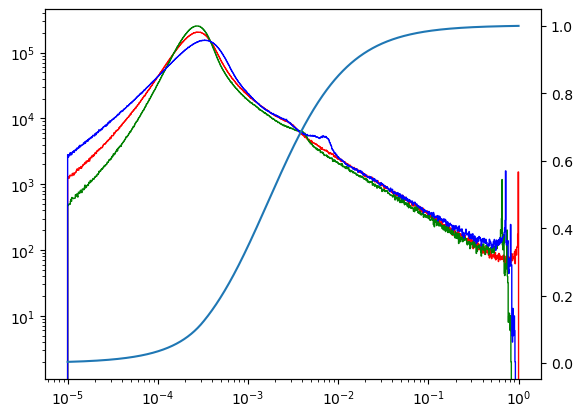

In [72]:
bins = np.logspace(-5,0,1000)
odp.show_hist(light_pp, bins=bins)
plt.xscale('log')
plt.twinx()

y = odp.ghs(bins, **ghs_args)
plt.plot(bins,y)

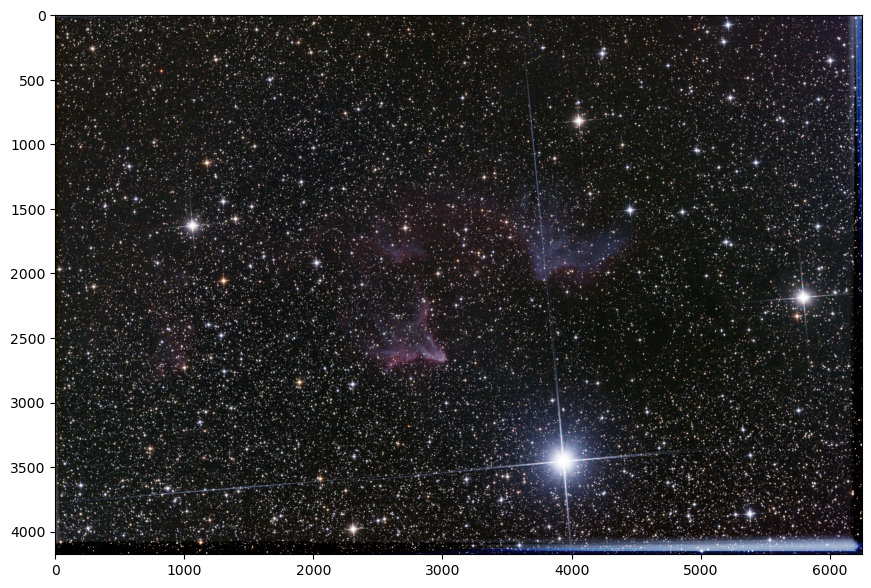

In [73]:
light_pp_ghs = odp.ghs(light_pp, **ghs_args)
odp.linear_rgb(light_pp_ghs, save=f'{tag}_pp_ghs.jpg', quality=95)

## HQ Output

For further manipulation

In [ ]:
import cv2

In [ ]:
data = np.flip(np.clip(light_pp_ghs*(2**16),0,2**16-1),axis=2).astype(dtype=np.uint16)
cv2.imwrite(f'{tag}.png',data)